In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import re


<h3> LOADING AND PREPROCESSING DATA</h3>

In [2]:
#Downloaded only the relevant results for each gene from CLinVar, may have to change depeending on results

cv_mybpc3_df = pd.read_csv("data/mybpc3_data.txt", delimiter="\t")
cv_myh7_df = pd.read_csv("data/myh7_data.txt", delimiter="\t")

#Removed last reviewed date from the disease status
cv_myh7_df["label"] = cv_myh7_df["Clinical significance (Last reviewed)"].apply(lambda x: x.split("(")[0])
cv_myh7_df.drop(columns=["Clinical significance (Last reviewed)"], inplace=True)

cv_mybpc3_df["label"] = cv_mybpc3_df["Clinical significance (Last reviewed)"].apply(lambda x: x.split("(")[0])
cv_mybpc3_df.drop(columns=["Clinical significance (Last reviewed)"], inplace=True)


cv_mybpc3_df.head()
cv_myh7_df.head()

,Name,Gene(s),Protein change,Condition(s),Review status,Accession,GRCh37Chromosome,GRCh37Location,GRCh38Chromosome,GRCh38Location,VariationID,AlleleID(s),dbSNP ID,Canonical SPDI,Unnamed: 15,label
0,NM_000257.4(MYH7):c.816A>T (p.Arg272Ser),MYH7,R272S,not provided,"criteria provided, single submitter",VCV002663533,14,23900189,14,23430980,2663533,2830981,NaN,NC_000014.9:23430979:T:A,NaN,Uncertain significance
1,NM_000257.4(MYH7):c.1072C>T (p.His358Tyr),MYH7,H358Y,not provided,"criteria provided, single submitter",VCV002663260,14,23899050,14,23429841,2663260,2830710,NaN,NC_000014.9:23429840:G:A,NaN,Uncertain significance
2,NM_000257.4(MYH7):c.196G>A (p.Gly66Ser),MYH7,G66S,not provided,"criteria provided, single submitter",VCV002662427,14,23902746,14,23433537,2662427,2829878,NaN,NC_000014.9:23433536:C:T,NaN,Uncertain significance
3,NM_000257.4(MYH7):c.639+1G>T,MYH7,NaN,not provided,"criteria provided, single submitter",VCV002644107,14,23900969,14,23431760,2644107,2810291,NaN,NC_000014.9:23431759:C:A,NaN,Uncertain significance
4,NM_000257.4(MYH7):c.1669C>A (p.Leu557Met),MYH7,L557M,not provided,"criteria provided, single submitter",VCV002644106,14,23897013,14,23427804,2644106,2810290,NaN,NC_000014.9:23427803:G:T,NaN,Uncertain significance


In [3]:
#Preprocess ClinVar data

for cv_df in [cv_myh7_df, cv_mybpc3_df]:
    # drop_idx_conflicting_unprov = cv_df[(cv_df["label"] == 'Conflicting interpretations of pathogenicity') | (cv_df["label"] == 'conflicting data from submitters') | (cv_df["label"] == 'not provided')].index
    
    #Normalize ClinVar labels to match those of AM
    # cv_df.drop(drop_idx_conflicting_unprov, inplace=True)

    print(len(cv_df[cv_df["label"].str.contains("Benign") | cv_df["label"].str.contains("benign")]))
    cv_df["label"] = cv_df["label"].apply(lambda x: "ambiguous" if x == "Uncertain significance" else ("likely_benign" if "Benign" in x or "benign" in x else "likely_pathogenic"))

    print(len(cv_df.loc[cv_df["label"] == "likely_benign"]))

1279
1279
870
870


In [4]:
# Load AlphaMissense predictions for the two genes

am_myh7_df = pd.read_csv("data/am_myh7_data.tsv", delimiter="\t")
am_mybpc3_df = pd.read_csv("data/am_mybpc3_data.tsv", delimiter="\t")

am_myh7_df.head()

,CHROM,POS,REF,ALT,genome,uniprot_id,transcript_id,protein_variant,am_pathogenicity,am_class
0,chr14,23412857,C,G,hg38,P12883,ENST00000355349.4,E1935D,0.0737,likely_benign
1,chr14,23412857,C,A,hg38,P12883,ENST00000355349.4,E1935D,0.0737,likely_benign
2,chr14,23412858,T,G,hg38,P12883,ENST00000355349.4,E1935A,0.2034,likely_benign
3,chr14,23412858,T,C,hg38,P12883,ENST00000355349.4,E1935G,0.1999,likely_benign
4,chr14,23412858,T,A,hg38,P12883,ENST00000355349.4,E1935V,0.2693,likely_benign


In [5]:
#Load EVE predictions for the two genes

eve_myh7_df = pd.read_csv("data/eve_myh7_data.csv")
eve_mybpc3_df = pd.read_csv("data/eve_mybpc3_data.csv")

eve_myh7_df.head()

,wt_aa,position,mt_aa,ClinVar_ClinicalSignificance,Gold_Stars,NumberSubmitters,Starred_Coarse_Grained_Clin_Sig,frequency_gv2,frequency_gv3,evolutionary_index_ASM,...,p_model,b_acmg_model,lb_acmg_model,lp_acmg_model,coarse_clinical_significance_post,clinical_significance_post,model_disagreement,CV_label_and_model_combined_with_other_evidence_disagreement,starred_label_and_model_disagreement,starred_label_and_model_combined_with_other_evidence_disagreement
0,M,1,A,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,NaN,NaN,False,False,False,False
1,M,1,C,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,NaN,NaN,False,False,False,False
2,M,1,D,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,NaN,NaN,False,False,False,False
3,M,1,E,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,NaN,NaN,False,False,False,False
4,M,1,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,NaN,NaN,False,False,False,False


In [6]:
#Preprocess EVE dataframe

eve_dfs = [eve_myh7_df, eve_mybpc3_df]
adj_eve_dfs = []
for eve_df in eve_dfs:
    adj_eve_df = pd.DataFrame()

    adj_eve_df = eve_df.dropna(subset="EVE_classes_75_pct_retained_ASM")

    #Standardize labels with those used above
    adj_eve_df["EVE_classes_75_pct_retained_ASM"] = adj_eve_df["EVE_classes_75_pct_retained_ASM"].apply(lambda x: "ambiguous" if x == "Uncertain" else ("likely_benign" if "Benign" in x or "benign" in x else "likely_pathogenic"))

    #Add mutation label to match those of ClinVar
    eve_df["protein_variant"] = eve_df["wt_aa"] + eve_df["position"].apply(lambda x: str(x)) + eve_df["mt_aa"]
    adj_eve_df["protein_variant"] = adj_eve_df["wt_aa"] + eve_df["position"].apply(lambda x: str(x)) + eve_df["mt_aa"]

    adj_eve_dfs.append(adj_eve_df)


eve_myh7_df_adj = adj_eve_dfs[0]
eve_mybpc3_df_adj = adj_eve_dfs[1]

/tmp/ipykernel_1849/2418727859.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adj_eve_df["EVE_classes_75_pct_retained_ASM"] = adj_eve_df["EVE_classes_75_pct_retained_ASM"].apply(lambda x: "ambiguous" if x == "Uncertain" else ("likely_benign" if "Benign" in x or "benign" in x else "likely_pathogenic"))
/tmp/ipykernel_1849/2418727859.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adj_eve_df["protein_variant"] = adj_eve_df["wt_aa"] + eve_df["position"].apply(lambda x: str(x)) + eve_df["mt_aa"]
/tmp

<h3> FINDING DISCORDANCE </h3>

In [7]:
#Find AM discrepancies with ClinVar for both genes

mismatch_dict = {}
for cv_df, am_df, gene in [(cv_myh7_df, am_myh7_df, "am_myh7"), (cv_mybpc3_df, am_mybpc3_df, "am_mybpc3")]:

    mismatch_df = pd.DataFrame()
    for i in range(len(cv_df)):
        matched_am_pred = am_df[am_df["protein_variant"] == cv_df.iloc[i]["Protein change"]]


        if not matched_am_pred.empty:
            matched_am_pred = matched_am_pred.iloc[0]

            exp_class = cv_df.iloc[i]["label"]
            status = cv_df.iloc[i]["Review status"]
            pred_class = matched_am_pred["am_class"]

            if exp_class != "ambiguous":
                if exp_class != pred_class:

                    matched_am_pred["ClinVar label"] = exp_class
                    matched_am_pred["ClinVar status"] = status

                    # print(matched_am_pred)
                    # print("flow")

                    mismatch_df = mismatch_df.append(matched_am_pred)
    
    mismatch_dict[gene] = mismatch_df

/tmp/ipykernel_1849/414588944.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mismatch_df = mismatch_df.append(matched_am_pred)
/tmp/ipykernel_1849/414588944.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mismatch_df = mismatch_df.append(matched_am_pred)
/tmp/ipykernel_1849/414588944.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mismatch_df = mismatch_df.append(matched_am_pred)
/tmp/ipykernel_1849/414588944.py:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  mismatch_df = mismatch_df.append(matched_am_pred)
/tmp/ipykernel_1849/414588944.py:27: FutureWarning: The frame.append method is deprecated and will be removed fr

In [20]:
#Observe mismatches for both genes

print(len(mismatch_dict["am_myh7"]))
print(list(mismatch_dict["am_myh7"]["protein_variant"].apply(lambda x: int(re.sub('\D', '', str(x))))))
mismatch_dict["am_myh7"].head(50)


134
[689, 200, 601, 1055, 423, 1040, 877, 1879, 652, 1030, 843, 734, 318, 1379, 555, 125, 822, 738, 1114, 1906, 822, 824, 852, 861, 1032, 1399, 779, 660, 226, 637, 135, 822, 783, 434, 852, 169, 924, 641, 865, 1239, 842, 848, 837, 542, 1272, 1184, 931, 822, 609, 796, 393, 439, 783, 376, 896, 1434, 602, 1846, 1524, 52, 1268, 530, 846, 1303, 1213, 842, 394, 1840, 928, 928, 1193, 848, 858, 935, 949, 1677, 849, 1596, 807, 865, 1207, 865, 1664, 858, 1820, 201, 1662, 882, 411, 207, 852, 544, 1045, 922, 1267, 1509, 1560, 1325, 1337, 869, 1854, 736, 1382, 1467, 723, 1344, 1836, 1359, 904, 1834, 1748, 930, 1902, 783, 847, 1079, 787, 894, 908, 736, 204, 1327, 870, 663, 1096, 858, 719, 869, 1459, 870, 1712, 663, 797, 982]


,CHROM,POS,REF,ALT,genome,uniprot_id,transcript_id,protein_variant,am_pathogenicity,am_class,ClinVar label,ClinVar status
8260,chr14,23426061,C,G,hg38,P12883,ENST00000355349.4,V689L,0.9478,likely_pathogenic,likely_benign,"criteria provided, single submitter"
11544,chr14,23431801,G,A,hg38,P12883,ENST00000355349.4,A200V,0.5483,ambiguous,likely_pathogenic,"criteria provided, single submitter"
8838,chr14,23427672,G,C,hg38,P12883,ENST00000355349.4,L601V,0.4057,ambiguous,likely_pathogenic,"criteria provided, single submitter"
5822,chr14,23422262,G,T,hg38,P12883,ENST00000355349.4,L1055M,0.1496,likely_benign,likely_pathogenic,"criteria provided, single submitter"
10066,chr14,23429095,C,T,hg38,P12883,ENST00000355349.4,A423T,0.1865,likely_benign,likely_pathogenic,no assertion criteria provided
5917,chr14,23422306,T,C,hg38,P12883,ENST00000355349.4,Q1040R,0.2753,likely_benign,likely_pathogenic,no assertion criteria provided
7008,chr14,23424818,A,G,hg38,P12883,ENST00000355349.4,M877T,0.2905,likely_benign,likely_pathogenic,no assertion criteria provided
375,chr14,23414026,T,C,hg38,P12883,ENST00000355349.4,K1879R,0.2235,likely_benign,likely_pathogenic,"criteria provided, single submitter"
8508,chr14,23427241,C,T,hg38,P12883,ENST00000355349.4,R652K,0.5207,ambiguous,likely_pathogenic,"criteria provided, single submitter"
5979,chr14,23423556,T,G,hg38,P12883,ENST00000355349.4,Q1030H,0.3505,ambiguous,likely_benign,"criteria provided, single submitter"


In [72]:
print(len(mismatch_dict["am_mybpc3"]))
mismatch_dict["am_mybpc3"].head(50)

121


,CHROM,POS,REF,ALT,genome,uniprot_id,transcript_id,protein_variant,am_pathogenicity,am_class,ClinVar label,ClinVar status
12638,chr11,47346368,T,C,hg38,Q14896,ENST00000545968.6,D310G,0.3435,ambiguous,likely_pathogenic,no assertion provided
11980,chr11,47346217,C,G,hg38,Q14896,ENST00000545968.6,K360N,0.4657,ambiguous,likely_pathogenic,"criteria provided, single submitter"
8006,chr11,47339740,C,T,hg38,Q14896,ENST00000545968.6,V660M,0.2616,likely_benign,likely_pathogenic,"criteria provided, single submitter"
10810,chr11,47343029,A,G,hg38,Q14896,ENST00000545968.6,F448S,0.4113,ambiguous,likely_pathogenic,"criteria provided, single submitter"
10110,chr11,47342697,C,A,hg38,Q14896,ENST00000545968.6,R502L,0.4558,ambiguous,likely_pathogenic,"criteria provided, single submitter"
14904,chr11,47350107,T,C,hg38,Q14896,ENST00000545968.6,S138G,0.1140,likely_benign,likely_pathogenic,"criteria provided, conflicting interpretations"
15750,chr11,47351321,T,G,hg38,Q14896,ENST00000545968.6,E70D,0.1383,likely_benign,likely_pathogenic,"criteria provided, conflicting interpretations"
3350,chr11,47333689,T,C,hg38,Q14896,ENST00000545968.6,S1020G,0.2404,likely_benign,likely_pathogenic,"criteria provided, conflicting interpretations"
8084,chr11,47339758,G,C,hg38,Q14896,ENST00000545968.6,R654G,0.2447,likely_benign,likely_pathogenic,no assertion criteria provided
9448,chr11,47342127,C,A,hg38,Q14896,ENST00000545968.6,A552S,0.1051,likely_benign,likely_pathogenic,"criteria provided, conflicting interpretations"


In [73]:
#Find mismatches between EVE and ClinVar

for cv_df, eve_df, gene in [(cv_myh7_df, eve_myh7_df_adj, "eve_myh7"), (cv_mybpc3_df, eve_mybpc3_df_adj, "eve_mybpc3")]:

    mismatch_df = pd.DataFrame()
    for i in range(len(cv_df)):
        matched_eve_pred = eve_df[eve_df["protein_variant"] == cv_df.iloc[i]["Protein change"]]

        if not matched_eve_pred.empty:
            matched_eve_pred = matched_eve_pred.iloc[0]

            exp_class = cv_df.iloc[i]["label"]
            status = cv_df.iloc[i]["Review status"]
            pred_class = matched_eve_pred["EVE_classes_75_pct_retained_ASM"]

            if exp_class != "ambiguous":
                if exp_class != pred_class:

                    matched_eve_pred["ClinVar label"] = exp_class
                    matched_eve_pred["ClinVar status"] = status

                    mismatch_df = mismatch_df.append(matched_eve_pred)
    
    mismatch_dict[gene] = mismatch_df[["protein_variant", "EVE_scores_ASM", "EVE_classes_75_pct_retained_ASM", "ClinVar label", "uncertainty_ASM", "ClinVar status"]]

/tmp/ipykernel_21637/252465715.py:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/252465715.py:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/252465715.py:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/252465715.py:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/252465715.py:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/252465715.py:22: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future

In [74]:
print(len(mismatch_dict["eve_myh7"]))
mismatch_dict["eve_myh7"].head(50)

282


,protein_variant,EVE_scores_ASM,EVE_classes_75_pct_retained_ASM,ClinVar label,uncertainty_ASM,ClinVar status
10720,E537A,0.613361,ambiguous,likely_pathogenic,0.667221,"criteria provided, single submitter"
6033,L302Q,0.350133,likely_benign,likely_pathogenic,0.647529,"criteria provided, single submitter"
13769,V689L,0.911706,likely_pathogenic,likely_benign,0.298573,"criteria provided, single submitter"
3997,A200V,0.424342,ambiguous,likely_pathogenic,0.681655,"criteria provided, single submitter"
12017,L601V,0.364945,ambiguous,likely_pathogenic,0.656210,"criteria provided, single submitter"
12060,T604A,0.344009,likely_benign,likely_pathogenic,0.643659,"criteria provided, single submitter"
35733,E1787Q,0.619193,ambiguous,likely_pathogenic,0.664458,"criteria provided, single submitter"
8235,T412S,0.357886,likely_benign,likely_pathogenic,0.652192,"criteria provided, single submitter"
4333,E217Q,0.622046,ambiguous,likely_pathogenic,0.663054,"criteria provided, single submitter"
2954,S148R,0.525667,ambiguous,likely_pathogenic,0.691829,"criteria provided, single submitter"


In [75]:
print(len(mismatch_dict["eve_mybpc3"]))
mismatch_dict["eve_mybpc3"].head(50)

83


,protein_variant,EVE_scores_ASM,EVE_classes_75_pct_retained_ASM,ClinVar label,uncertainty_ASM,ClinVar status
13190,V660M,0.394654,ambiguous,likely_pathogenic,0.670785,"criteria provided, single submitter"
22876,M1144T,0.432483,ambiguous,likely_benign,0.684002,"criteria provided, single submitter"
10029,R502L,0.616226,ambiguous,likely_pathogenic,0.665881,"criteria provided, single submitter"
20385,S1020G,0.101186,likely_benign,likely_pathogenic,0.327681,"criteria provided, conflicting interpretations"
3532,R177P,0.384702,ambiguous,likely_pathogenic,0.666319,"criteria provided, conflicting interpretations"
13065,R654G,0.124543,likely_benign,likely_pathogenic,0.375881,no assertion criteria provided
11035,A552S,0.244240,likely_benign,likely_pathogenic,0.555918,"criteria provided, conflicting interpretations"
25264,C1264F,0.392013,ambiguous,likely_pathogenic,0.669640,"criteria provided, single submitter"
9889,R495L,0.556401,ambiguous,likely_pathogenic,0.686771,"criteria provided, conflicting interpretations"
6827,V342I,0.040874,likely_benign,likely_pathogenic,0.170712,"criteria provided, conflicting interpretations"


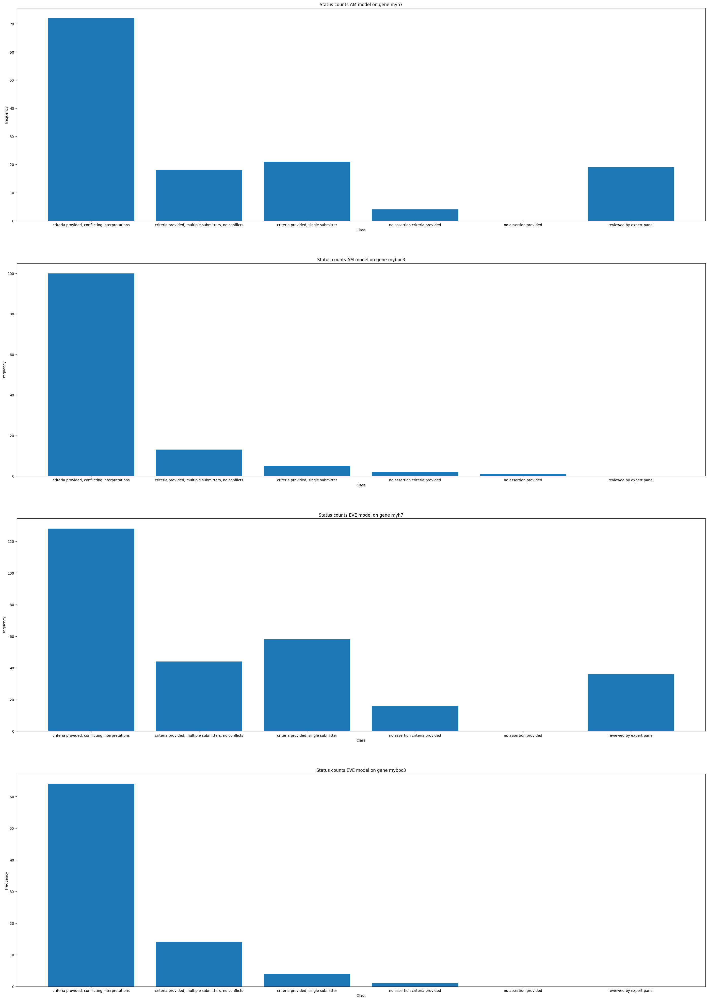

In [76]:
#Create bar graphs to quantify review status of mismatches

fig, axs = plt.subplots(4, 1, figsize=(35,50))

#Make list of all possible ClinVar review statuses
statuses = sorted(cv_myh7_df["Review status"].unique())

sankey_value_dict = {}
count = 0
for key in mismatch_dict.keys():
    status_dict = {k:v for k,v in zip(statuses, [0]*len(statuses))}
    
    #Get counts of statuses present in mismatch table
    stat_counts = mismatch_dict[key]["ClinVar status"].value_counts().sort_index().to_dict()

    #Get zero-count for statuses that were not present
    for status in stat_counts.keys():
        status_dict[status] = stat_counts[status]
    
    axs[count].set_xlabel("Class")
    axs[count].set_ylabel("Frequency")
    axs[count].set_title(f"Status counts {key.split('_')[0].upper()} model on gene {key.split('_')[1]}")
    axs[count].bar(sorted(statuses), status_dict.values())

    count += 1

    #Save status counts for Sankey figure
    sankey_value_dict[key] = dict(sorted(status_dict.items(), key=lambda x: x[0]))

In [278]:
#Create Sankey diagrams for review status spread of mismatches


for mod in ["am", "eve"]:
  sankey_labels = [f"{mod.upper()} Misclassifications", "Misclass. on MYH7", "Misclass. on MYBPC3"]
  sankey_labels.extend(statuses*2)
  print(sankey_labels)

  source = [0, 0]
  source.extend([1]*len(sankey_value_dict[f"{mod}_myh7"]))
  source.extend([2]*len(sankey_value_dict[f"{mod}_mybpc3"]))

  target = list(range(1,len(sankey_labels)))

  value = [len(mismatch_dict[f"{mod}_myh7"]), len(mismatch_dict[f"{mod}_mybpc3"])]
  value.extend(list(sankey_value_dict[f"{mod}_myh7"].values()))
  value.extend(list(sankey_value_dict[f"{mod}_mybpc3"].values()))

  link = dict(source = source, target = target, value = value)

  fig = go.Figure(data=[go.Sankey(
    
      # Define nodes
      node = dict(
        pad = 15,
        thickness = 15,
        line = dict(color = "black", width = 0.5),
        label =  sankey_labels
        # color =  None
      ),
      # Add links
      link = link
  )])

  fig.update_layout(title="Review Status Spread of Mismatched Variants")
  fig.show()


['AM Misclassifications', 'Misclass. on MYH7', 'Misclass. on MYBPC3', 'criteria provided, conflicting interpretations', 'criteria provided, multiple submitters, no conflicts', 'criteria provided, single submitter', 'no assertion criteria provided', 'no assertion provided', 'reviewed by expert panel', 'criteria provided, conflicting interpretations', 'criteria provided, multiple submitters, no conflicts', 'criteria provided, single submitter', 'no assertion criteria provided', 'no assertion provided', 'reviewed by expert panel']


['EVE Misclassifications', 'Misclass. on MYH7', 'Misclass. on MYBPC3', 'criteria provided, conflicting interpretations', 'criteria provided, multiple submitters, no conflicts', 'criteria provided, single submitter', 'no assertion criteria provided', 'no assertion provided', 'reviewed by expert panel', 'criteria provided, conflicting interpretations', 'criteria provided, multiple submitters, no conflicts', 'criteria provided, single submitter', 'no assertion criteria provided', 'no assertion provided', 'reviewed by expert panel']


In [13]:
# Put all variants with at least one mismatch in table

#Start by standardizing column names

# eve_gene_dict = {"eve_myh7": eve_myh7_df, "eve_mybpc3": eve_mybpc3_df}
# am_gene_dict = {"am_myh7": am_myh7_df, "am_mybpc3": am_mybpc3_df}

# print(len(mismatch_dict))

# print(mismatch_dict.keys())

# for key in mismatch_dict.keys():
#     if "am" in key:
#         mismatch_dict[key].drop(columns=["CHROM", "POS", "REF", "ALT", "genome", "uniprot_id", "transcript_id"], inplace=True)
#         mismatch_dict[key]["EVE_scores_ASM"] = eve_gene_dict[key.replace("am", "eve")][eve_gene_dict[key.replace("am", "eve")]["protein_variant"].isin(mismatch_dict[key]["protein_variant"].values)]["EVE_scores_ASM"].values
#         mismatch_dict[key]["EVE_classes_75_pct_retained_ASM"] = eve_gene_dict[key.replace("am", "eve")][eve_gene_dict[key.replace("am", "eve")]["protein_variant"].isin(mismatch_dict[key]["protein_variant"].values)]["EVE_classes_75_pct_retained_ASM"].values                      
#     else:
#         mismatch_dict[key]["am_pathogenicity"] = am_gene_dict[key.replace("eve", "am")][am_gene_dict[key.replace("eve", "am")]["protein_variant"].isin(mismatch_dict[key]["protein_variant"].values)]["am_pathogenicity"].values
#         mismatch_dict[key]["am_class"] = am_gene_dict[key.replace("eve", "am")][am_gene_dict[key.replace("eve", "am")]["protein_variant"].isin(mismatch_dict[key]["protein_variant"].values)]["am_class"].values

#     print(eve_gene_dict[key.replace("am", "eve")][eve_gene_dict[key.replace("am", "eve")]["protein_variant"].isin(mismatch_dict[key]["protein_variant"].values)]["EVE_scores_ASM"])
#     print(eve_gene_dict[key.replace("am", "eve")][eve_gene_dict[key.replace("am", "eve")]["protein_variant"].isin(mismatch_dict[key]["protein_variant"].values)]["EVE_classes_75_pct_retained_ASM"])
#     print(mismatch_dict[key])
#     break

# concat_df = pd.DataFrame()
# for key in mismatch_dict.keys():
#     concat_df = pd.concat([concat_df, mismatch_dict[key]])

# print(len(concat_df))

# concat_df.to_csv(path_or_buf="three_way_comp.csv", index=False)
# concat_df.head(50)



In [95]:
#Find AM classifications for variants not in ClinVar

new_preds_dict = {}
for cv_df, am_df, gene in [(cv_myh7_df, am_myh7_df, "am_myh7"), (cv_mybpc3_df, am_mybpc3_df, "am_mybpc3")]:
    cv_variants = cv_df["Protein change"].values
    new_preds_df = pd.DataFrame()
    for i in range(len(am_df)):
        if am_df.iloc[i]["protein_variant"] not in cv_variants:
            
            am_pred = am_df.iloc[i]
            new_preds_df = new_preds_df.append(am_pred)
    
        new_preds_dict[gene] = new_preds_df

print("Length of tot preds for AM: " + str(len(am_myh7_df)))
print("Length of tot preds in CV: " + str(len(cv_myh7_df)))
print("Diff in lengths: " + str(len(am_myh7_df) - len(cv_myh7_df)))
print("Length of new preds for AM: " + str(len(new_preds_dict["am_myh7"])))

new_preds_dict["am_myh7"].head()


/tmp/ipykernel_21637/3290467954.py:11: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/3290467954.py:11: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/3290467954.py:11: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/3290467954.py:11: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/3290467954.py:11: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/3290467954.py:11: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a 

Length of tot preds for AM: 12850
Length of tot preds in CV: 4107
Diff in lengths: 8743
Length of new preds for AM: 10362


/tmp/ipykernel_21637/3290467954.py:11: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/3290467954.py:11: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/3290467954.py:11: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/3290467954.py:11: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/3290467954.py:11: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/3290467954.py:11: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a 

,CHROM,POS,REF,ALT,genome,uniprot_id,transcript_id,protein_variant,am_pathogenicity,am_class
0,chr14,23412857,C,G,hg38,P12883,ENST00000355349.4,E1935D,0.0737,likely_benign
1,chr14,23412857,C,A,hg38,P12883,ENST00000355349.4,E1935D,0.0737,likely_benign
2,chr14,23412858,T,G,hg38,P12883,ENST00000355349.4,E1935A,0.2034,likely_benign
3,chr14,23412858,T,C,hg38,P12883,ENST00000355349.4,E1935G,0.1999,likely_benign
4,chr14,23412858,T,A,hg38,P12883,ENST00000355349.4,E1935V,0.2693,likely_benign


In [96]:
#Find EVE classifications for variants not in ClinVar


for cv_df, eve_df, gene in [(cv_myh7_df, eve_myh7_df_adj, "eve_myh7"), (cv_mybpc3_df, eve_mybpc3_df_adj, "eve_mybpc3")]:
    cv_variants = cv_df["Protein change"].values
    new_preds_df = pd.DataFrame()
    for i in range(len(eve_df)):
        cv_variants = cv_df["Protein change"].values
        if eve_df.iloc[i]["protein_variant"] not in cv_variants:

            eve_pred = eve_df.iloc[i]

            new_preds_df = new_preds_df.append(eve_pred)
    
    new_preds_dict[gene] = new_preds_df[["protein_variant", "EVE_scores_ASM", "EVE_classes_75_pct_retained_ASM", "uncertainty_ASM"]]

print("Length of tot preds for EVE: " + str(len(eve_myh7_df)))
print("Length of tot preds in CV: " + str(len(cv_myh7_df)))
print("Diff in lengths: " + str(len(eve_myh7_df) - len(cv_myh7_df)))
print("Length of new preds for EVE: " + str(len(new_preds_dict["eve_myh7"])))

new_preds_dict["eve_myh7"].head()



/tmp/ipykernel_21637/2845891817.py:13: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/2845891817.py:13: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/2845891817.py:13: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/2845891817.py:13: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/2845891817.py:13: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/2845891817.py:13: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a 

/tmp/ipykernel_21637/2845891817.py:13: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/2845891817.py:13: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/2845891817.py:13: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/2845891817.py:13: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/2845891817.py:13: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

/tmp/ipykernel_21637/2845891817.py:13: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a 

Length of tot preds for EVE: 38700
Length of tot preds in CV: 4107
Diff in lengths: 34593
Length of new preds for EVE: 34134


,protein_variant,EVE_scores_ASM,EVE_classes_75_pct_retained_ASM,uncertainty_ASM
221,A12C,0.801072,likely_pathogenic,0.498913
222,A12D,0.304899,likely_benign,0.614958
223,A12E,0.545997,ambiguous,0.688910
224,A12F,0.487181,ambiguous,0.692818
225,A12G,0.433803,ambiguous,0.684357


{'am_myh7': {'ambiguous': 1418, 'likely_benign': 2997, 'likely_pathogenic': 5947}, 'am_mybpc3': {'ambiguous': 3340, 'likely_benign': 5697, 'likely_pathogenic': 4623}, 'eve_myh7': {'ambiguous': 9708, 'likely_benign': 6495, 'likely_pathogenic': 17931}, 'eve_mybpc3': {'ambiguous': 4818, 'likely_benign': 5587, 'likely_pathogenic': 8230}}


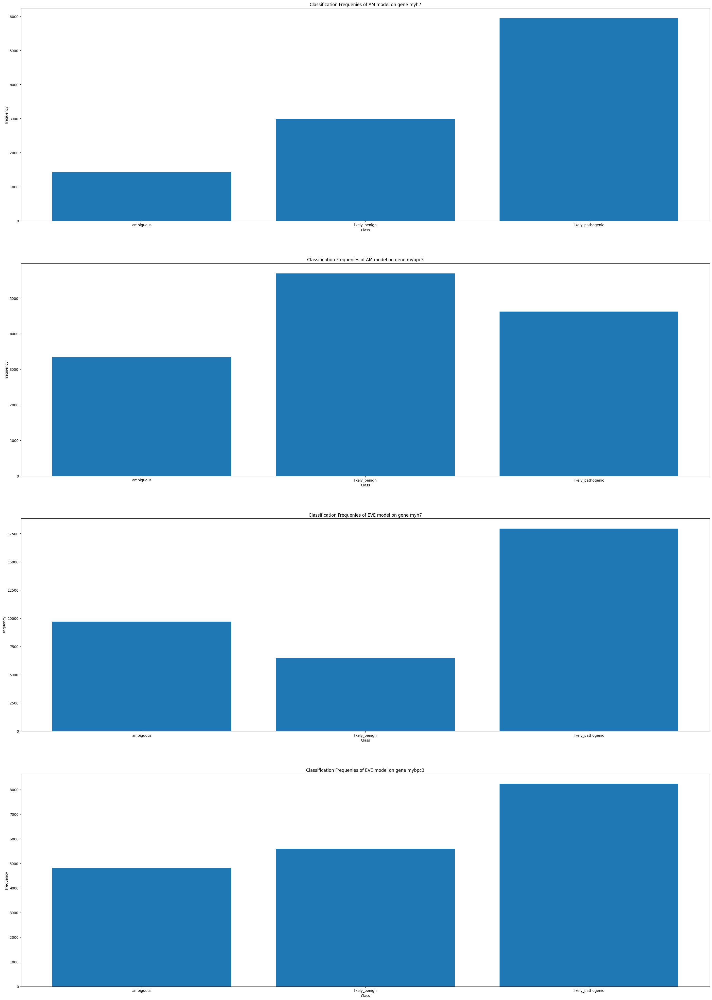

In [125]:
#Create bar graph to gauge classification of new variants

fig, axs = plt.subplots(4, 1, figsize=(35,50))
variant_classes = new_preds_dict["eve_myh7"]["EVE_classes_75_pct_retained_ASM"].unique()
count = 0

label_counts = {}

for key in new_preds_dict.keys():
    
    axs[count].set_xlabel("Class")
    axs[count].set_ylabel("Frequency")
    axs[count].set_title(f"Classification Frequenies of {key.split('_')[0].upper()} model on gene {key.split('_')[1]}")
    if count <= 1:
        vals = new_preds_dict[key]["am_class"].value_counts()
        axs[count].bar(sorted(variant_classes), vals.sort_index())
        label_counts[key] = vals.sort_index().to_dict()
    else:
        vals = new_preds_dict[key]["EVE_classes_75_pct_retained_ASM"].value_counts()
        axs[count].bar(sorted(variant_classes), vals.sort_index())
        label_counts[key] = vals.sort_index().to_dict()

    
    count += 1

print(label_counts)

In [274]:
#Create stacked bar graph of new labels for the model-gene pairs

print(label_counts["am_myh7"]["ambiguous"])

fig = go.Figure()

color_dict = {
        "ambiguous": 'rgb(180, 180, 180)',
        "likely_benign": 'rgb(50, 100, 220)',
        "likely_pathogenic": 'rgb(220, 50, 50)'}

annotations = []
y_offset = 0
gene_count = 0
for mod_gene in label_counts.keys():
        x_offset = 0
        
        for label in sorted(new_preds_dict["am_myh7"]["am_class"].unique()):
                val = label_counts[mod_gene][label]
                frac = val/sum(list(label_counts[mod_gene].values()))
                fig.add_trace(go.Bar(
                        y=[mod_gene.split('_')[0].upper() + " on " + mod_gene.split('_')[1][:-1].upper() + mod_gene.split('_')[1][-1]],
                        x=[frac*100],
                        orientation='h',
                        marker=dict(
                                color=color_dict[label],
                                line=dict(color='rgb(0, 0, 0)', width=1)
                        ),
                        name=label,
                        showlegend = True if gene_count == 0 else False))

                annotations.append(dict(xref='paper', yref='y',
                                        x= x_offset+(frac*.6), y=y_offset,
                                        xanchor='right',
                                        text="%.2f" % ((val/sum(list(label_counts[mod_gene].values())))*100) + ' %',
                                        font=dict(family='Arial', size=14,
                                                color='rgb(40, 40, 40)'),
                                        showarrow=False, align='right'))
        
                x_offset += frac*.9
        gene_count += 1
        y_offset += 1

print(annotations)


fig.update_layout(barmode='stack', margin=dict(l=5, r=5, t=35, b=10))
fig.update_layout(title="Distribution of Labels for Newly Classified Variants", annotations=annotations)
fig.show()


1418
[{'xref': 'paper', 'yref': 'y', 'x': 0.08210770121598147, 'y': 0, 'xanchor': 'right', 'text': '13.68 %', 'font': {'family': 'Arial', 'size': 14, 'color': 'rgb(40, 40, 40)'}, 'showarrow': False, 'align': 'right'}, {'xref': 'paper', 'yref': 'y', 'x': 0.29669947886508397, 'y': 0, 'xanchor': 'right', 'text': '28.92 %', 'font': {'family': 'Arial', 'size': 14, 'color': 'rgb(40, 40, 40)'}, 'showarrow': False, 'align': 'right'}, {'xref': 'paper', 'yref': 'y', 'x': 0.7278228141285467, 'y': 0, 'xanchor': 'right', 'text': '57.39 %', 'font': {'family': 'Arial', 'size': 14, 'color': 'rgb(40, 40, 40)'}, 'showarrow': False, 'align': 'right'}, {'xref': 'paper', 'yref': 'y', 'x': 0.146705710102489, 'y': 1, 'xanchor': 'right', 'text': '24.45 %', 'font': {'family': 'Arial', 'size': 14, 'color': 'rgb(40, 40, 40)'}, 'showarrow': False, 'align': 'right'}, {'xref': 'paper', 'yref': 'y', 'x': 0.4702928257686676, 'y': 1, 'xanchor': 'right', 'text': '41.71 %', 'font': {'family': 'Arial', 'size': 14, 'color

<h3> CALCULATING MISMATCH ACCURACY, PRECISION, & RECALL </h3>

In [17]:
#Find accuracy of AlphaMissense and EVE for both each model-gene pair
accuracy_scores = {}
precision_dict = {}
recall_dict = {}

micro_avg_precision_scores = {}
micro_avg_recall_scores = {}
macro_avg_precision_scores = {}
macro_avg_recall_scores = {}

count = 0

for cv_df, pred_df, model_gene_pair in [(cv_myh7_df, am_myh7_df, "am_myh7"), (cv_mybpc3_df, am_mybpc3_df, "am_mybpc3"),
                           (cv_myh7_df, eve_myh7_df_adj, "eve_myh7"), (cv_mybpc3_df, eve_mybpc3_df_adj, "eve_mybpc3")]:

    # mismatch_df = pd.DataFrame()
    matched_count = 0
    mismatch_count = 0
    newly_class = 0

    #Define dictionary to hold values needed to find the precision and recall for each model-gene pair
    metrics_dict = {"likely_pathogenic" : {"true_pos": 0, "false_pos": 0, "false_neg": 0},
                    "likely_benign/ambiguous" : {"true_pos": 0, "false_pos": 0, "false_neg": 0}}
    for i in range(len(cv_df)):
        matched_pred = pred_df[pred_df["protein_variant"] == cv_df.iloc[i]["Protein change"]]

        #Drops frameshift mutations and NaNs

        if not matched_pred.empty:
            # Database may have duplicates, only consider one row
            matched_pred = matched_pred.iloc[0]

            #Get count for number of variants that match and are mismatched between model and ClinVar
            exp_class = cv_df.iloc[i]["label"]

            #Use correct column name based on order
            if count <= 1:
                pred_class = matched_pred["am_class"]
            else:
                pred_class = matched_pred["EVE_classes_75_pct_retained_ASM"]

            if exp_class != "ambiguous":

                if exp_class == pred_class:
                    matched_count += 1
                else:
                    mismatch_count += 1
            else:

                #New prediction made by model, mark is as positive
                matched_count += 1
                newly_class += 1
            


            #Use match/mismatch count to get true positive, false positive, and false negative count
            curr_class = exp_class
            
            if curr_class != "ambiguous":
                
                #Use combination key if class is likely_benign or ambiguous
                if curr_class == "likely_benign":
                    curr_class = "likely_benign/ambiguous"
                
                if pred_class == "likely_benign" or pred_class == "ambiguous":
                    pred_class = "likely_benign/ambiguous"

                #True positive if class is predicted correctly
                if pred_class == curr_class:
                    metrics_dict[curr_class]["true_pos"] += 1
                
                else:
                    #If mismatch: 

                    #False negative for this class
                    metrics_dict[curr_class]["false_neg"] += 1

                    #False positive for the predicted class
                    metrics_dict[pred_class]["false_pos"] += 1
    
    #Calculate accuracy scores for each model on each gene
    accuracy_scores[model_gene_pair] = matched_count/(mismatch_count+matched_count)

    # Calculate precision and recall metrics for each class
    precision_dict[model_gene_pair] = {x: metrics_dict[x]["true_pos"]/(metrics_dict[x]["true_pos"]+metrics_dict[x]["false_pos"]) for x in metrics_dict.keys()}
    recall_dict[model_gene_pair] = {x: metrics_dict[x]["true_pos"]/(metrics_dict[x]["true_pos"]+metrics_dict[x]["false_neg"]) for x in metrics_dict.keys()}
    
    # Calculate macro- an micro- precision and recall
    # macro_avg_precision_scores[model_gene_pair] = sum(precision_list)/len(metrics_dict)
    # macro_avg_recall_scores[model_gene_pair] = sum(recall_list)/len(metrics_dict)

    overall_tp = sum([metrics_dict[x]["true_pos"] for x in metrics_dict.keys()])
    overall_fp = sum([metrics_dict[x]["false_pos"] for x in metrics_dict.keys()])
    overall_fn = sum([metrics_dict[x]["false_neg"] for x in metrics_dict.keys()])

    micro_avg_precision_scores[model_gene_pair] = overall_tp/(overall_tp + overall_fp)
    micro_avg_recall_scores[model_gene_pair] = overall_tp/(overall_tp + overall_fn)

    count += 1


    

In [18]:
# Put Metrics above into table

#Create columns for the accuracy and precision/recall tables
index = pd.MultiIndex.from_product([["AlphaMissense", "EVE"],
                                    ["MYH7", "MYBPC3"]], names=["model", "gene"])
col1 = pd.MultiIndex.from_arrays([["Accuracy"],
                                    [""]], names=["metric", "class"])
cols = pd.MultiIndex.from_product([["Precision", "Recall"],
                                    ["likely_pathogenic", "likely_benign/ambiguous"]], names=["metric", "class"])

# Load accuracy scores into table
accuracy_scores = accuracy_scores.values()
accuracy_df = pd.DataFrame(accuracy_scores, index=index, columns=col1)

# Load precision and recall values into 4x4 matrix for each model-gene pair
pre_rec_dict = {"Precision": precision_dict, "Recall": recall_dict}
data = []
for model_gene_pair in precision_dict.keys():
    row = []
    for col in cols:
        row.append(pre_rec_dict[col[0]][model_gene_pair][col[1]])
    data.append(row)
pre_rec_df = pd.DataFrame(data, index=index, columns=cols)

# Join accuracy and precision/recall table then show it
table_1 = accuracy_df.join(pre_rec_df)
table_1.head()

metric                Accuracy         Precision                          \
class                          likely_pathogenic likely_benign/ambiguous   
model         gene                                                         
AlphaMissense MYH7    0.969270          0.981884                0.194030   
              MYBPC3  0.982891          0.956522                0.613636   
EVE           MYH7    0.922414          0.989071                0.100629   
              MYBPC3  0.979937          0.916667                0.636364   

metric                          Recall                          
class                likely_pathogenic likely_benign/ambiguous  
model         gene                                              
AlphaMissense MYH7            0.833846                0.722222  
              MYBPC3          0.564103                0.964286  
EVE           MYH7            0.558642                0.888889  
              MYBPC3          0.647059                0.913043

<h4>TODO</h4>



<ul>
    <li>And here consider the level of evidence</li>
    <li>Consider VUSs from ClinVar</li>
    <li>Add variants labeled as pathogenic in models that are not present in ClinVar </li>
        <ul>
            <li>(Because labs could have excluded variants they found to be pathogenic from the database, 
            in addition)</li>
        </ul>
    <li>Look for mismatches at the same site in ClinVar database</li>
    <li>Make a table detailing mismatch numbers</li>
    
</ul>
---<b>After this, building a classifier</b>


<h4>QUESTIONS</h4>
<ul>
    <li>Should we include the newly classified variants in the performacy metrics or not? (YES)</li>
    <li>Should the micro- or macro- average classified variants be used for analysis (or both)? (NOT FOR NOW)</li>
    <li>Aren't mismatches for variants with conflicting interpretations unhelpful for interpretation as we really don't know whether it is a mismatch?</li>
</ul>



<h4>NOTES</h4>
<ul>
    <li>Micro-avergaing both of the statistics will probably give a better view of the performance because we want and idea of how well the models
        do on the variants as individuals more than each of the categories</li>
</ul>


<h4>DONE FOR 1/10 CHECK-IN</h4>
<ul>
    <li>Added model labels for variants not present in ClinVar (with bar graph)</li>
    <li>Created table for precision and recall</li>
    <li>Included variants with conflicting interpretations</li>
    <li>Created bar graphs for review status counts</li>

</ul>

['Q734E']
